In [56]:
import torch
import utils.data_utils
import numpy as np
import librosa
import matplotlib.pyplot as plt
import model

In [19]:
def load_model(ckpt):
    bwg = model.BiWaveGAN(
        slice_len=32768,
        latent_dim=ckpt['latent dim'], 
        model_size=ckpt['model size'], 
        discrim_filters=ckpt['disrim filters'],
        z_discrim_depth=ckpt['z discrim depth'],
        joint_discrim_depth=ckpt['joint discrim depth'],
        phaseshuffle_rad=ckpt['phaseshuffle rad'],
        device=device)
    bwg.G.load_state_dict(ckpt['G state_dict'])#, strict=strict)
    bwg.E.load_state_dict(ckpt['E state_dict'])
    bwg.D.load_state_dict(ckpt['D state_dict'])
    bwg.eval()
    
    return bwg 

def spectrogram(x, n_fft=512, hop_length=128, win_length=None):
    """
    Creates a spectrogram from a loaded audio file
    """
    S = np.abs(librosa.stft(x, n_fft, hop_length, win_length)) ** 2
    S = librosa.power_to_db(S)
    return S



In [3]:
device = 'cpu'
ckpt_path = "../NAS/logs/20211123-220127/it75000.ckpt"

In [4]:
ckpt = torch.load(ckpt_path, map_location=torch.device(device))

In [5]:
biwavegan = load_model(ckpt)

In [66]:
z = torch.Tensor(100, biwavegan.latent_dim).uniform_(-1, 1).to(device)
x = biwavegan.generate(z) # shouldnt need this
x_recon = biwavegan.reconstruct(x).detach().numpy()
x = x.detach().numpy()

In [67]:
x.shape

(100, 1, 32768)

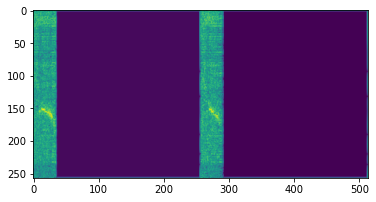

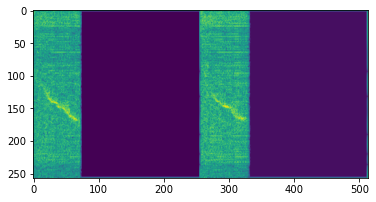

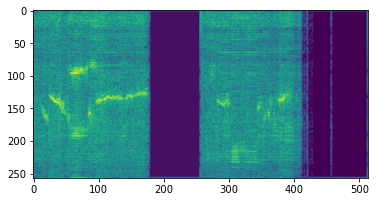

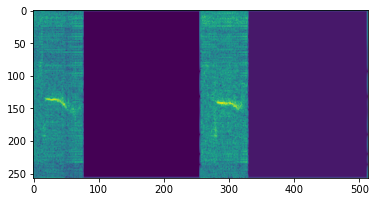

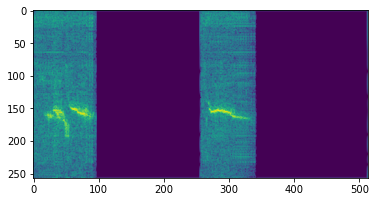

...

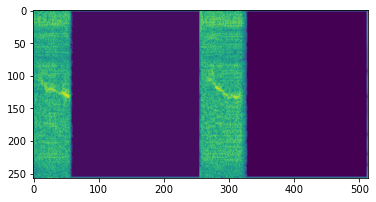

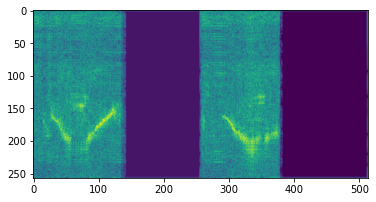

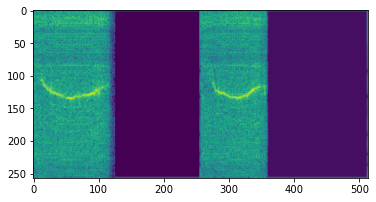

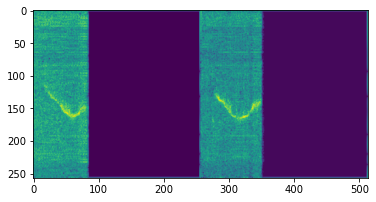

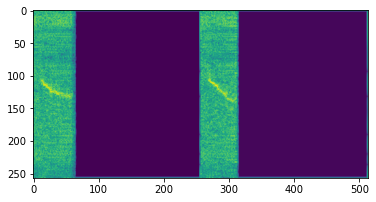

In [68]:
for x_i, recon_i in zip(x, x_recon):
    S_x = spectrogram(x_i.flatten())
    S_recon = spectrogram(recon_i.flatten())
    S = np.concatenate((S_x, S_recon), axis=1)
    plt.imshow(S)
    plt.show()

In [59]:
test_data_path = '../NAS/data/mupet_data/syllables/test'
test_dataset = utils.data_utils.WAVDataset(test_data_path, 250000, 32768)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16)
print(len(test_dataset))

3146


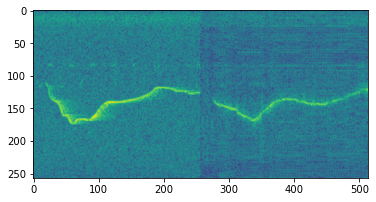

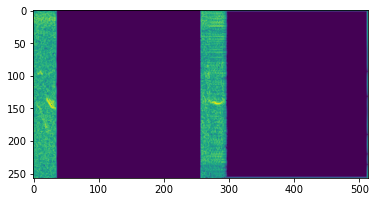

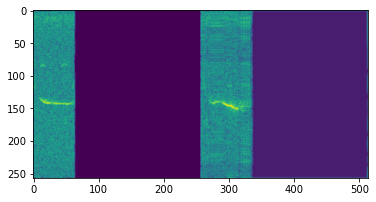

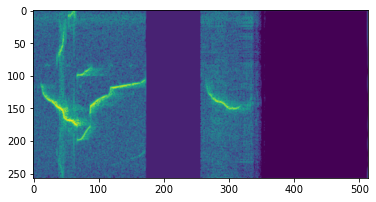

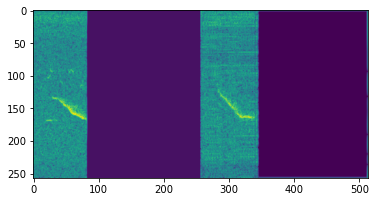

...

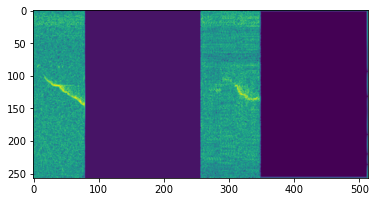

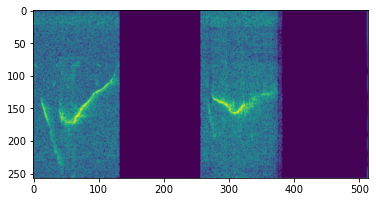

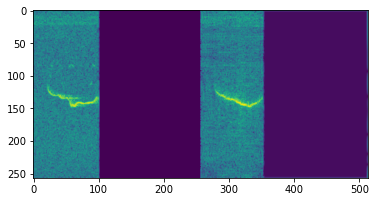

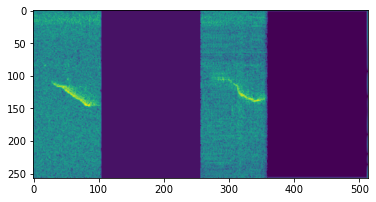

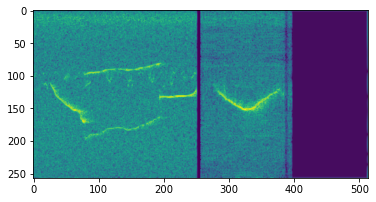

In [70]:
for i, x in enumerate(test_dataset):
    if i == 100:
        break
    recon = biwavegan.reconstruct(x.unsqueeze(0)).detach().numpy()
    x = x.detach().numpy()
    S_x = spectrogram(x.flatten())
    S_recon = spectrogram(recon.flatten())
    S = np.concatenate((S_x, S_recon), axis=1)
    plt.imshow(S)
    plt.show()